The state of Rio Grande do Sul in southern Brazil is currently experiencing [massive floods due to intense rain fall](https://en.wikipedia.org/wiki/2024_Rio_Grande_do_Sul_floods), affecting hundreds of thousands of people. The scale of these events is difficult to comprehend both at the human and at the physical level. To help visualize how large the floods are, I thought it would be good to look at the [Landsat](https://en.wikipedia.org/wiki/Landsat_program) scenes from before and during the floods around the city of Porto Alegre (the state capital).

I'll use [xlandsat](https://www.compgeolab.org/xlandsat) and other scientific Python libraries to create visualizations of Landsat data and an animated gif to flip back and forth between the before and after images.

In [1]:
import xlandsat as xls
import matplotlib.pyplot as plt  # for plotting
from matplotlib_scalebar.scalebar import ScaleBar  # to add a scale bar
import imageio  # to make a gif

I downloaded two Landsat scenes from [USGS EarthExplorer](https://earthexplorer.usgs.gov/). Both were Landsat 8 Level 1 Collection 2 scenes with WRS path/row = 221/81, one from 2024/04/06 and the other from 2024/05/08. I downloaded the full scene and places the `.tar` files in the same folder as this Jupyter notebook.

<div class="callout">
    
**Don't know how to use EarthExplorer?** Watch this [YouTube tutorial I made a while ago](https://www.youtube.com/watch?v=Wn_G4fvitV8) going through the entire process.

</div>

## Loading the data

Now I can load the before scene, cropped to show mostly the region of Porto Alegre.

In [2]:
region = (425000, 530000, -3350000, -3270000)  # UTM meters
bands = ("red", "green", "blue")
before = xls.load_scene("LC08_L1TP_221081_20240406_20240412_02_T1.tar", bands=bands, region=region)

And we can make a quick RGB composite and plot it for a quick check of our scene.

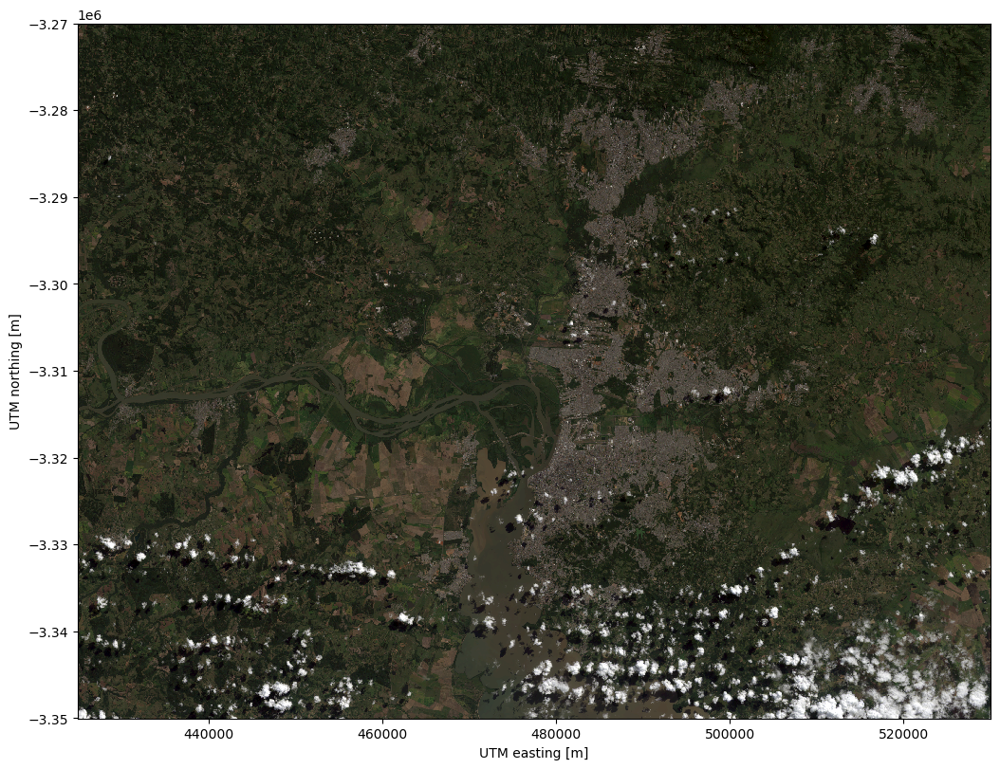

In [3]:
rgb = xls.composite(before)
# Need to adjust the colors to remove the top-of-the-atmosphere
# glare from the L1 product
rgb = xls.adjust_l1_colors(rgb)

plt.figure(figsize=(12, 8), layout="constrained")
rgb.plot.imshow()
plt.axis("scaled")
plt.show()

Now I can load the panchromatic band from the same file and cropped to the same region. The pan band has a higher resolution of 15m and we'll use it to sharpen our image.

In [4]:
before_pan = xls.load_panchromatic("LC08_L1TP_221081_20240406_20240412_02_T1.tar", region=region)

Now pansharpen the scene to get the RGB data at 15m instead of 30m.

In [5]:
before_sharp = xls.pansharpen(before, before_pan)

And plot the pansharpened RGB composite of the before scene.

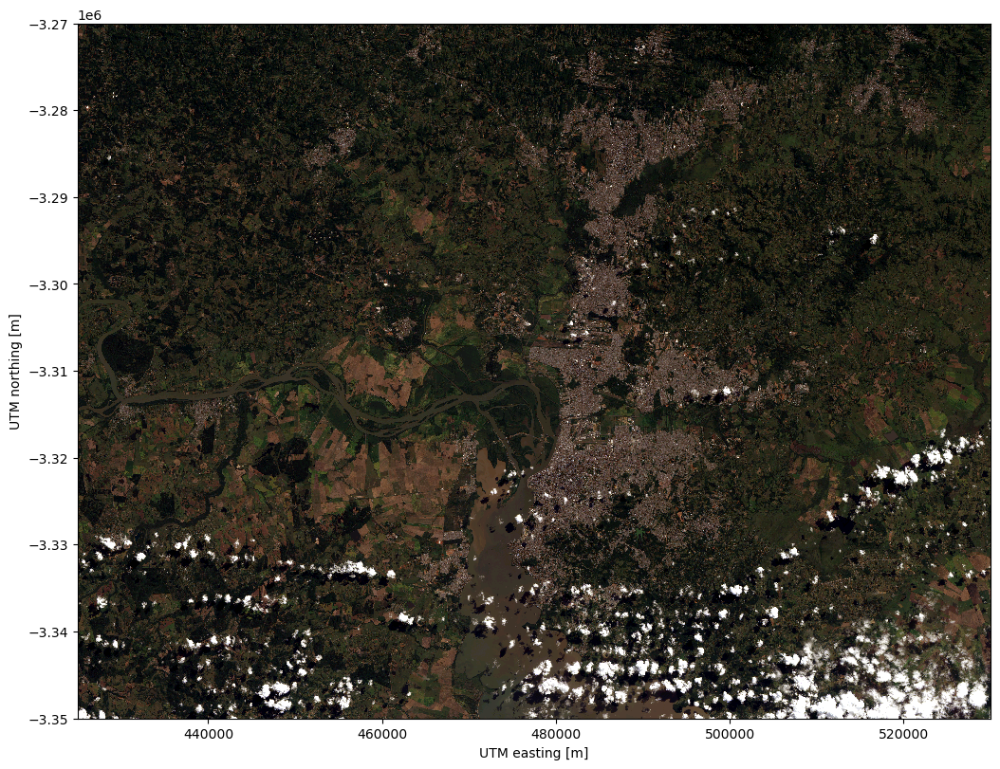

In [6]:
rgb = xls.composite(before_sharp)
rgb = xls.adjust_l1_colors(rgb, percentile=1)

plt.figure(figsize=(12, 8), layout="constrained")
rgb.plot.imshow()
plt.axis("scaled")
plt.show()

Now I can do the same thing for the after scene.

In [7]:
after = xls.load_scene("LC08_L1TP_221081_20240508_20240508_02_RT.tar", bands=bands, region=region)
after_pan = xls.load_panchromatic("LC08_L1TP_221081_20240508_20240508_02_RT.tar", region=region)
after_sharp = xls.pansharpen(after, after_pan)

## Creating before and after images

Now I make two images of the RGB composites for the before and after scenes with added annotations. I had to adjust the percentile range for the color correction in the after scene because of the higher amount of clouds in that image.

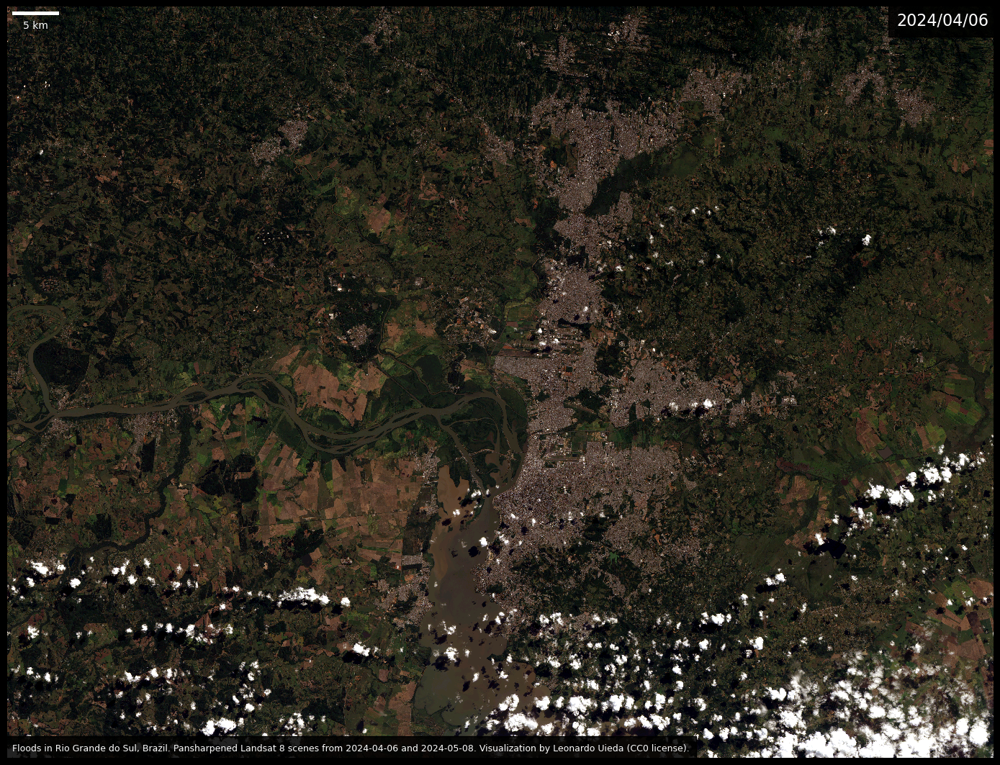

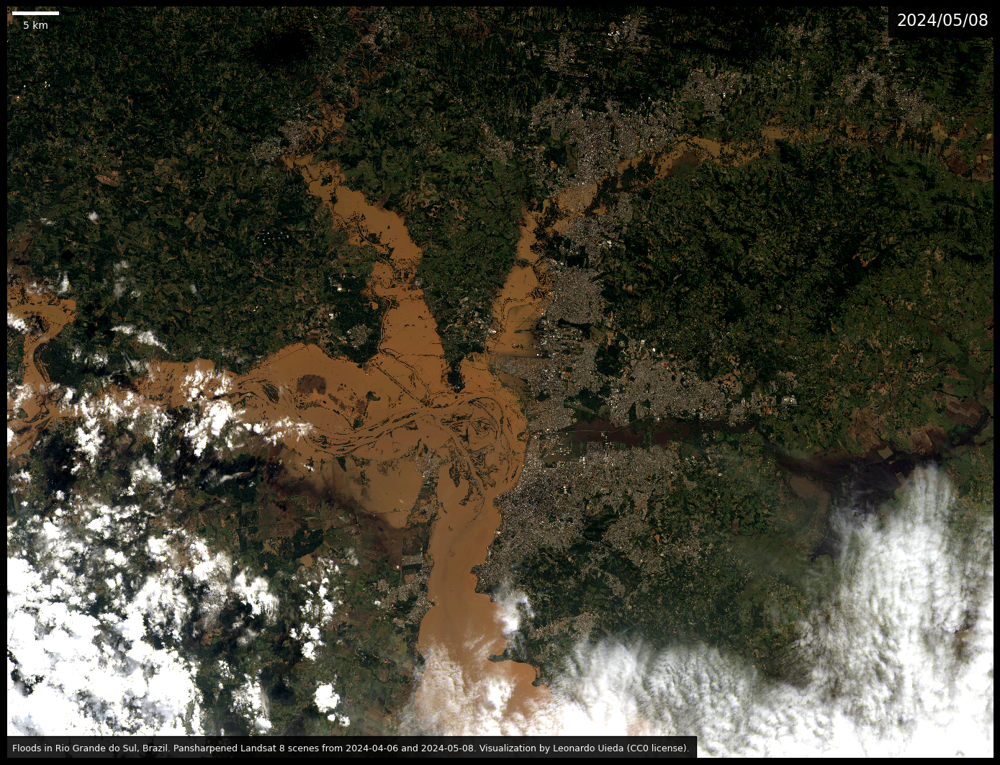

In [8]:
for scene, percentile in [(before_sharp, 1), (after_sharp, 5)]:
    rgb = xls.composite(scene)
    rgb = xls.adjust_l1_colors(rgb, percentile=percentile)
    
    plt.figure(figsize=(14, 12), layout="tight", facecolor="black")
    ax = plt.subplot(111)
    rgb.plot.imshow(ax=ax)
    # Make sure pixels are square
    ax.set_aspect("equal")
    # Remove so that it looks fancier
    ax.axis("off")
    # Add a caption at the bottom
    text = (
        "Floods in Rio Grande do Sul, Brazil. "
        "Pansharpened Landsat 8 scenes from "
        f"{before.attrs['date_acquired']} and "
        f"{after.attrs['date_acquired']}. "
        "Visualization by Leonardo Uieda (CC0 license)."
    )
    ax.text(
        0.005, 0.01, 
        text, 
        transform=ax.transAxes,
        color="white",
        fontsize=9,
        bbox=dict(
            facecolor="#000000dd",
            boxstyle="square",
            pad=0.75,
        ),
    )
    # Add the date to the top
    ax.text(
        0.995, 0.975, 
        f"{scene.attrs['date_acquired'].replace('-', '/')}", 
        transform=ax.transAxes,
        horizontalalignment="right",
        color="white",
        fontsize=16,
        bbox=dict(
            facecolor="#000000dd",
            boxstyle="square",
            pad=0.5,
        ),
    )
    # Add a scale bar
    ax.add_artist(
        ScaleBar(
            dx=1, 
            units="m", 
            location="upper left", 
            box_alpha=0,
            color="white", 
            scale_loc="bottom", 
            width_fraction=0.005, 
            length_fraction=0.06,
            pad=0.4,
        )
    )
    # Save the figure at 600 and 100 DPI
    for dpi, prefix in [(600, ""), (100, "-lowres")]:
        plt.savefig(
            f"rio-grande-do-sul-floods-{scene.attrs['date_acquired']}{prefix}.jpg", 
            dpi=dpi, 
            bbox_inches="tight",
        )
plt.show()

The massive scale of the floods are quite visible from the two images above. The brown water dominates the center of the image and there is also a darker, almost black, flooded river cutting through the city in the center right of the image.

## Creating an animated gif

To help visualize this further, I'll use the `imageio` module to load the two images and make a looping gif animation. I'll use the lower resolution images to avoid making the gif file too large. Setting `loop=0` makes the gif loop infinitely.

In [9]:
images = [
    imageio.v3.imread(f"rio-grande-do-sul-floods-{scene.attrs['date_acquired']}-lowres.jpg")
    for scene in [before, after]
]
imageio.mimsave("rio-grande-do-sul-floods-2024.gif", images, duration=1000, loop=0)

![Animation of before and after the floods, with the after image showing a large amount of brown water at the center of the image where there were city and farms.](rio-grande-do-sul-floods-2024.gif)

Flipping back and forth makes it easier to see all of the affected areas. It's devastating to see such destruction. Unfortunately, it's also a sign of things to come as the climate continues to change due to human action during late-stage capitalism.

## Downloading the data and images

You can **download** the Landsat data, both images in high and low resolution, the animated gif, and this source code from figshare at doi:[10.6084/m9.figshare.25800298](https://doi.org/10.6084/m9.figshare.25800298). All are made available under the [CC-0 license](https://creativecommons.org/public-domain/cc0/).

<div class="callout">

**How to help:** You can find out more about how to help the people affected by the floods from [this report on Terra](https://www.terra.com.br/noticias/doacoes-para-o-rio-grande-do-sul-saiba-como-doar-e-quais-sao-os-pontos-de-coleta-mais-proximos-de-sua-casa,caa8f066ede3cddbd20f2b2766edb2df1hot6p70.html) (in Portuguese).

</div>